# What is this doing


Takes the QC file I created from the raw Single Cell data and proccesses it in to clusters and subclusters.

## Setup

### Imports

In [1]:
import numpy as np
import scanpy as sc
import os
import pandas as pd
import bbknn

### Single Cell settings

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(80) 
sc.settings.file_format_figures = 'png'
sc.settings.savefigs = False
use_first_n_samples = 0
full_sparse = False

C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_53684\738880785.py:2: FutureWarning: The specified parameters ('scanpy',) are no longer positional. Please specify them like `scanpy=80`
  sc.settings.set_figure_params(80)


### Defining a function for processing the data & determing the parameters

In [3]:
def processing_batch(adata, neighbors=15, key='batch', reso=0.4, random_state=0):  # Higher resolution yields more leiden clusters 
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    sc.logging.print_memory_usage()
    sc.pp.neighbors(adata, n_neighbors=neighbors)
    sc.pl.pca_variance_ratio(adata, log=True)
    bbknn.bbknn(adata, batch_key=key, neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=reso)
    sc.pl.umap(adata, color='leiden')

### Reading the excisting h5ad file I created previously in the QC pipeline 

In [4]:
#adata after QC
adata = sc.read(r'/Code/data/single_cell/animals/chicken/ca1/new_genome/''chicken_a1_after_qc.h5ad') 

sc.read_h5ad(r'/Code/data/single_cell/animals/chicken/ca1/new_genome/''chicken_a1_after_qc.h5ad')

# If the anndata object is processed and contains the raw data in adata.raw run -  adata = adata.raw.to_adata()

AnnData object with n_obs × n_vars = 18073 × 17843
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

## Preprocessing the data 

In [5]:
adata

AnnData object with n_obs × n_vars = 18073 × 17843
    obs: 'treatment', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_MT', 'pct_counts_MT', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids', 'n_cells', 'MT', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'treatment_colors'

In [6]:
adata.obs

,treatment,n_genes,n_genes_by_counts,total_counts,total_counts_MT,pct_counts_MT,S_score,G2M_score,phase
AAACCCACACACAGAG-1-control,control,560,560,853.0,50.0,5.861665,-0.112280,-0.101890,G1
AAACCCACAGCATCTA-1-control,control,448,448,738.0,8.0,1.084011,-0.044485,0.066661,G2M
AAACCCAGTCGAAGCA-1-control,control,590,590,999.0,13.0,1.301301,-0.150111,-0.042115,G1
AAACCCAGTTCGGTTA-1-control,control,848,848,1443.0,49.0,3.395703,0.119211,-0.107894,S
AAACCCATCTGTGCAA-1-control,control,607,607,1062.0,21.0,1.977401,-0.093703,-0.043555,G1
...,...,...,...,...,...,...,...,...,...
TTTGTTGCATAGAAAC-1-pic,pic,396,396,801.0,0.0,0.000000,-0.066591,0.198969,G2M
TTTGTTGGTCGGCACT-1-pic,pic,616,616,1417.0,26.0,1.834862,-0.095216,0.005396,G2M
TTTGTTGGTCGTTTCC-1-pic,pic,338,338,673.0,1.0,0.148588,0.113311,-0.074711,S
TTTGTTGGTGTTACTG-1-pic,pic,472,472,843.0,122.0,14.472124,0.024499,-0.042855,S


In [7]:
adata.var

,gene_ids,n_cells,MT,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
SPRY2,ENSGALG00010000711,67,False,67,0.003957,99.664446,79.0
PCDH20,ENSGALG00010000715,61,False,61,0.004257,99.694496,85.0
NDFIP2,ENSGALG00010000717,1737,False,1737,0.107427,91.300646,2145.0
RBM26,ENSGALG00010000720,6803,False,6803,0.494215,65.928782,9868.0
RNF219,ENSGALG00010000724,323,False,323,0.018531,98.382331,370.0
...,...,...,...,...,...,...,...
POLD1,ENSGALG00010000526,13,False,13,0.000651,99.934893,13.0
ENSGALG00010000446,ENSGALG00010000446,11,False,11,0.000551,99.944909,11.0
DENND4B,ENSGALG00010000306,58,False,58,0.003005,99.709521,60.0
ENSGALG00010000495,ENSGALG00010000495,6,False,6,0.000300,99.969950,6.0


normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    Gene indices [  303  9588 11352 17483 17495] fell into a single bin: their normalized dispersion was set to 1.
    Decreasing `n_bins` will likely avoid this effect.
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


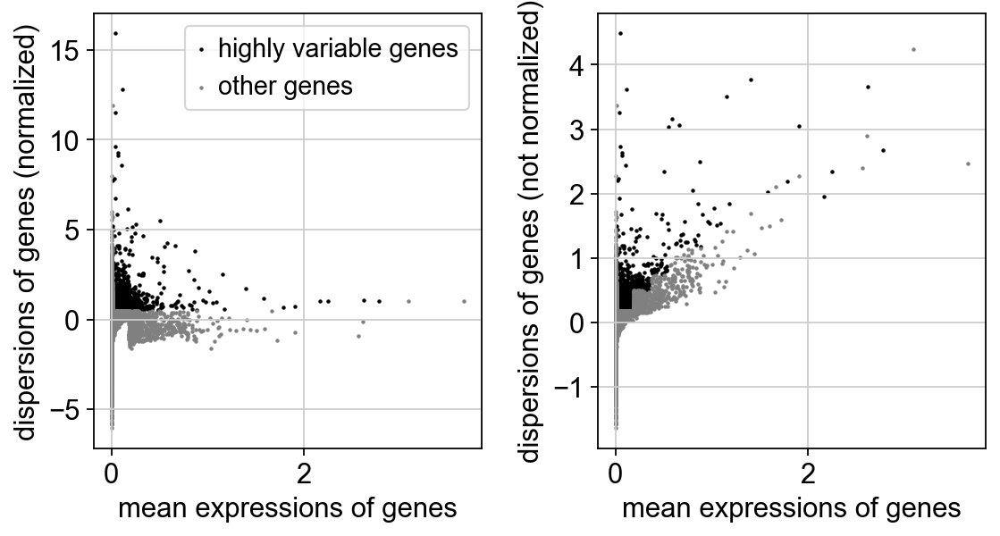

In [8]:
# Cleaning, normalizing, reducing dimensionality, clustering cells and creating visualizations.

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(adata)
adata.raw = adata
# adata = adata[:, adata.var.highly_variable] # For filtering non Highly variable genes. We usually keep all the genes. 

In [9]:
sc.pp.regress_out(adata, ['total_counts','pct_counts_MT'])

# Got it from: https://github.com/theislab/single-cell-tutorial/issues/35
sc.pp.scale(adata, max_value=10)
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.umap(adata) 

regressing out ['total_counts', 'pct_counts_MT']
    sparse input is densified and may lead to high memory use
    finished (0:04:29)
    ... clipping at max_value 10
computing PCA
    with n_comps=50


c:\Python\Python310\lib\site-packages\scanpy\preprocessing\_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


    finished (0:00:20)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:33)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:36)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


    ... clipping at max_value 10
computing PCA
    with n_comps=50
    finished (0:00:21)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
Memory usage: current 3.33 GB, difference +3.33 GB
computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:03)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


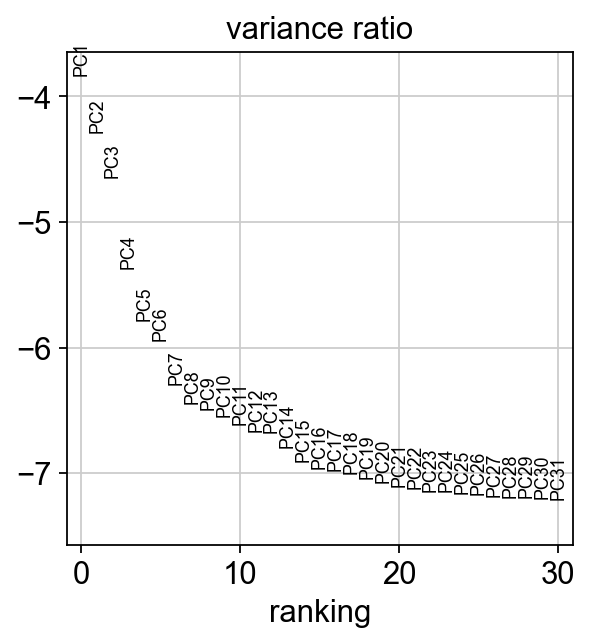

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
running Leiden clustering


C:\Users\TzachiHNB2\AppData\Local\Temp\ipykernel_53684\2800874316.py:9: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=reso)


    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


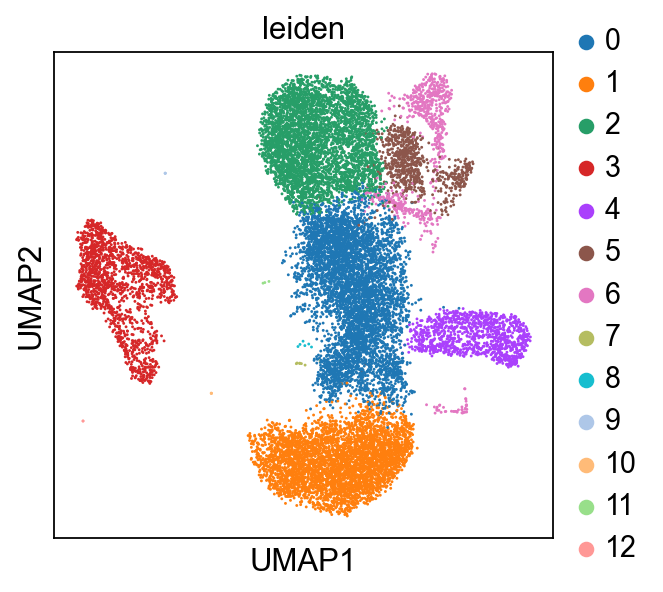

In [10]:
processing_batch(adata, key='treatment')

ranking genes
    consider 'treatment' groups:
    with sizes: [4294 3089 3460 7230]
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:31)


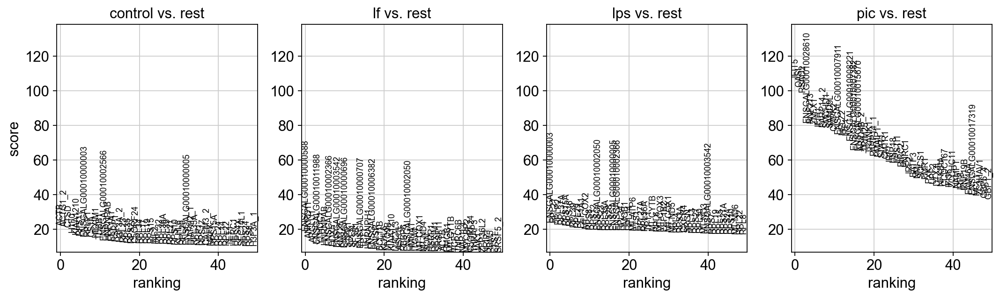

,control,lf,lps,pic
0,ACTB,ENSGALG00010000588,ENSGALG00010000003,IFIT5
1,ACTG1_2,ANKRD11,RPL21,OASL
2,CTSD,ARGLU1,RPLP2,RSAD2
3,H1F0,ENSGALG00010011988,RPL37A,ENSGALG00010028610
4,KIAA1210,YTHDC1,RPS15A,RNF213
5,RPS11,HNRNPAB,RPS16,ZNFX1
6,ENSGALG00010000003,ENSGALG00010002366,RPL39,IFIH1
7,RPLP1,DDX5,RPL29,PARP14_2
8,CSTA,ENSGALG00010003542,EEF1A1,SMCHD1
9,HEXIM1,KMT2E,MT-COX2,SAMD9L


In [11]:
sc.tl.rank_genes_groups(adata, groupby='treatment', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=50, sharey=True)
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(20)

# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color = ['PLAC8', 'CD83', 'CD74', 'CD79B', 'CD38', 'IL10', 'CD7'], size=50)

In [12]:
adata.obs['treatment'].value_counts()

treatment
pic        7230
control    4294
lps        3460
lf         3089
Name: count, dtype: int64

### UMAP's

Markers test box

In [ ]:
# sc.pl.umap(adata, color=['CD81'], size=20)

#### T cells

In [ ]:
# sc.pl.umap(adata, color=['CD3D','CD247','TCF7','GPR171'], size=20)

# sc.pl.umap(adata, color='leiden', size=20)

In [ ]:
# T cells. 'CCR7' is a marker for T cells and also B cells. Markers from Roy's Extended_Data_Figures.
# Markers for T cells https://www.beckman.com/resources/cell-types/blood-cells/leukocytes/lymphocytes/t-cells
sc.pl.umap(adata, color=['CD3D','CD3E','CD28','CD226','CD247', 
                         'CD4','CD7_3','CD38','STMN1','LEF1',
                         'RORA','GPR171','CCR7','CXCR4','TCF7',
                         'GPR183_1','GPR183_2','ALOX5AP','IL7R','HOPX',
                         'CD8A_2','CD8B','CD82'], size=30)

sc.pl.umap(adata, color='leiden', size=30)

In [ ]:
# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='CD3D', size=30)
# sc.pl.dotplot(adata, 'CD3D', groupby='treatment', standard_scale='var')

# sc.pl.umap(adata[adata.obs['treatment'] == 'lps'], color='CD3D', size=30)
# sc.pl.dotplot(adata, 'CD3D', groupby='treatment', standard_scale='var')

In [ ]:
# sc.pl.umap(adata[adata.obs['treatment'] == 'control'], color='IFNAR2', size=30)
# sc.pl.dotplot(adata, 'IFNAR2', groupby='treatment', standard_scale='var')

# sc.pl.umap(adata[adata.obs['treatment'] == 'pic'], color='IFNAR2', size=30)
# sc.pl.dotplot(adata, 'IFNAR2', groupby='treatment', standard_scale='var')

#### B cells

In [ ]:
# B cells markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['CD79B', 'CD38','IRF8','STMN1','IGJ','TCF4_1',
                         'TCF4_2', 'CCR7','PXK','BANK1','BACH2','CD74',
                         'PLAC8_1','PLAC8_2','IGHM','HLA-DPB1_5',
                         'HLA-DPB1_6','HLA-DMA','CD83','CD81'], size=30)

celltype = {'0':'0','1':'1','2':'T_cells','3':'3','4':'4','5':'T_cells','6':'T_cells',
            '7':'7','8':'8','9':'9','10':'10','11':'11','12':'12'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### RBC

In [ ]:
# RBC markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['STMN1','HBA','HBM','SLC4A1','ANK1'], size=30)

celltype = {'0':'0','1':'1','2':'T_cells','3':'3','4':'B_cells','5':'T_cells','6':'T_cells',
            '7':'7','8':'8','9':'9','10':'10','11':'11','12':'12'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Platelets

In [ ]:
# Platelets markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['TUBB1','PLEK','B2M','GP1BA_1','F13A1',
                         'GNAS','TAGLN2','OAZ1','CD226','PECAM1',
                         'CD36','GP1BA_2','ITGB3','ENSGALG00010014668'], size=30)

celltype = {'0':'0','1':'1','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells',
            '7':'7','8':'8','9':'9','10':'10','11':'11','12':'12'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### Monocytes

In [ ]:
# Monocytes markers from Roy's data and from https://panglaodb.se/markers.html?cell_type=%27Platelets%27#google_vignette

sc.pl.umap(adata, color=['SPI1','S100A4','C1QA','LYZ','LGALS3','CSF1R',
                         'MAFB','CD7_3','TET2','CD40','TLR4','S100A10_2',
                         'S100A11','CSTA','CCR2','CCL8_1','CCL8_3','TXN',
                         'MAFB','ACP5','GBP1_1','GBP1_2','GBP1_3','IRF7',
                         'PLSCR1','RGS1','S100A6','MRC1_3','OASL',
                         'IFIT5','S100A9','RSAD2','ZNFX1','IFIH1','SMCHD1',
                         'PARP14_2','ENSGALG00010007911','CMPK2'], size=30)

celltype = {'0':'0','1':'Platelets','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells',
            '7':'7','8':'8','9':'9','10':'10','11':'11','12':'12'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=20)

#### All clusters

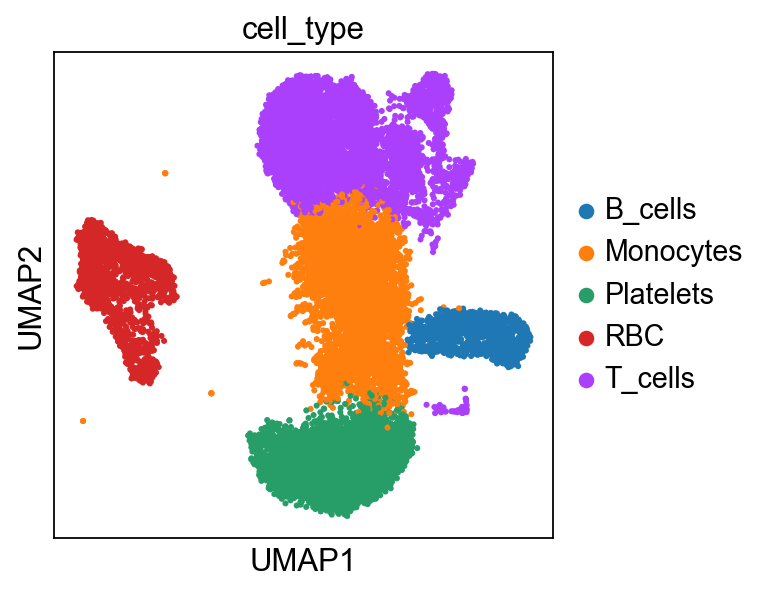

In [13]:
celltype = {'0':'Monocytes','1':'Platelets','2':'T_cells','3':'RBC','4':'B_cells','5':'T_cells','6':'T_cells',
            '7':'Monocytes','8':'Monocytes','9':'Monocytes','10':'Monocytes','11':'Monocytes','12':'Monocytes'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color='cell_type', size=30, save=True)

In [14]:
adata.obs['cell_type'].value_counts()

cell_type
T_cells      5614
Monocytes    5411
Platelets    4331
RBC          1612
B_cells      1105
Name: count, dtype: int64

### ISG genes list

In [106]:
df_isg_genes = pd.read_csv('/Code/data/single_cell/animals/chicken/ca1/new_genome/ISG_genes_ca1_new_genome.csv', index_col=0)
df_isg_genes = df_isg_genes.sort_index()

df_isg_genes

""
names
ADAR
AZI2
B2M
C2
CASP8
...
USP25
WARS
ZC3HAV1


In [107]:
isg_genes_list = df_isg_genes.index.tolist()
isg_genes_list

['ADAR',
 'AZI2',
 'B2M',
 'C2',
 'CASP8',
 'CD274',
 'CD47',
 'CMPK2',
 'CMTR1',
 'DHX58',
 'DNAJA1',
 'DNAJC13',
 'DTX3L',
 'EHD4',
 'ENSGALG00010006625',
 'ENSGALG00010007382',
 'ERAP1',
 'FAM46A',
 'FMR1',
 'IFI35',
 'IFIH1',
 'IRF1',
 'IRF7',
 'ISG20L2',
 'MORC3',
 'MOV10',
 'MX1',
 'MYD88',
 'N4BP1',
 'NLRC5',
 'NMI',
 'NUB1',
 'OASL',
 'PARP12',
 'PARP14_1',
 'PARP14_2',
 'PARP9',
 'PML_1',
 'PML_2',
 'PSMB1',
 'RFX5',
 'RICTOR',
 'RNF114',
 'RNF19B',
 'RNF213',
 'RNF31',
 'RSAD2',
 'SAT1',
 'SHISA5',
 'SLC25A28',
 'SOCS1',
 'STAT1',
 'STAT2',
 'TDRD7',
 'TNFSF10',
 'TRAFD1',
 'TRIM25',
 'UBA7',
 'UBE2L6',
 'USP18',
 'USP25',
 'WARS',
 'ZC3HAV1',
 'ZCCHC2',
 'ZNFX1']

#### UMAP's of the ISG genes

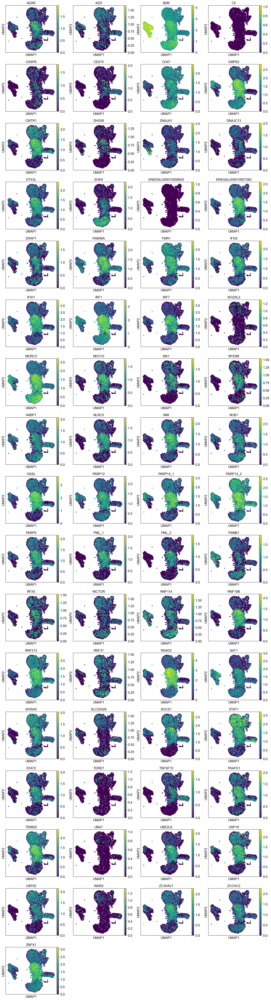

In [108]:
celltype = {'0':'Platelets','1':'T_cells','2':'B_cells','3':'Monocytes','4':'T_cells','5':'RBC','6':'Monocytes'}
adata.obs['cell_type'] = adata.obs.leiden.map(celltype).astype('category')
sc.pl.umap(adata, color=isg_genes_list, size=50)

#### Dotplot of the ISG genes in expressed in turtle

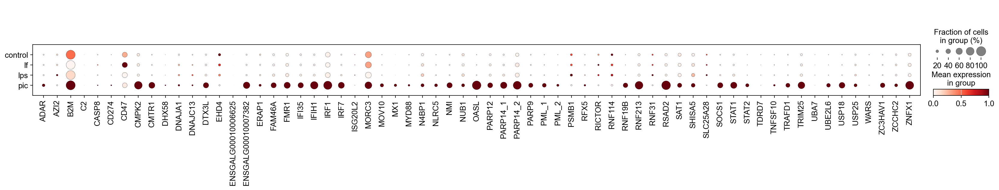

In [109]:
sc.pl.dotplot(adata, isg_genes_list, groupby='treatment', standard_scale='var')

#### Subclustering

##### T cells

In [ ]:
# Subclustering the T_cells cluster i found. there are two options to do the same function:

subset_adata_t = adata[adata.obs.cell_type == 'T_cells'].copy()
subset_adata_t

# t_cluster = adata[adata.obs.leiden.isin(['1','4'])]

# bbknn.bbknn(t_cluster, batch_key='treatment', neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
# sc.tl.umap(t_cluster)
# sc.tl.leiden(t_cluster, resolution=0.4)
# sc.pl.umap(t_cluster, color =['leiden'])

In [ ]:
bbknn.bbknn(subset_adata_t, batch_key='treatment', neighbors_within_batch=2, metric='euclidean', n_pcs=30, trim=None)
sc.tl.umap(subset_adata_t)
sc.tl.leiden(subset_adata_t, resolution=0.4)
sc.pl.umap(subset_adata_t, color=['CD3E','CD3D','CD28','TCF7','IL7R','CD8B','CD82','CD226',
                                  'CD247','CD4','CD7_3','CD38','STMN1','LEF1','RORA','GPR171','CCR7',
                                  'CXCR4','TCF7','GPR183_1','GPR183_2','ALOX5AP','IL7R','HOPX',
                                  'CD8A_2','leiden'], size=30)

In [ ]:
sc.tl.rank_genes_groups(subset_adata_t, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(subset_adata_t, n_genes=25, sharey=False)
pd.set_option('display.max_columns', None)
pd.DataFrame(subset_adata_t.uns['rank_genes_groups']['names']).head(100).to_csv(r'/Code/data/single_cell/animals/chicken/ca1/new_genome/''subset_adata_rank_genes_t_cells_top100.csv', index=False)

In [ ]:
sc.pl.umap(subset_adata_t[subset_adata_t.obs['treatment'] == 'control'], color='CD28', size=30)
sc.pl.dotplot(subset_adata_t, 'CD28', groupby='treatment', standard_scale='var')

sc.pl.umap(subset_adata_t[subset_adata_t.obs['treatment'] == 'pic'], color='CD28', size=30)
sc.pl.dotplot(subset_adata_t, 'CD28', groupby='treatment', standard_scale='var')

In [ ]:
sc.tl.dendrogram(subset_adata_t, groupby='leiden')
sc.pl.dendrogram(subset_adata_t, groupby='leiden')

In [ ]:
subset_adata_t.obs['leiden'].value_counts()

In [ ]:
sc.tl.leiden(subset_adata_t, resolution=0.4)
clusgene = list(pd.DataFrame(subset_adata_t.uns['rank_genes_groups']['names']).head(100)['0'])
sc.pl.dotplot(subset_adata_t, [i for i in clusgene[:50] if i.startswith('RP') == False], groupby='leiden', standard_scale=None)
sc.pl.dotplot(subset_adata_t, ['CD3D','CD3E','CD28','CD226','CD247','CD4',
                               'CD7_3','CD38','STMN1','LEF1','RORA','GPR171',
                               'CCR7','CXCR4','TCF7','GPR183_1','GPR183_2',
                               'ALOX5AP','IL7R','HOPX'], groupby='leiden', standard_scale='var')
sc.pl.umap(subset_adata_t, color='leiden')    # For visualization only

In [ ]:
# sc.pl.rank_genes_groups_dotplot(subset_adata, n_genes=5, standard_scale='var')
sc.pl.umap(subset_adata_t, color=find_gene('CD4') + find_gene('CD8') + find_gene('NKG7')
           + find_gene('CD226') + find_gene('IL2RA') + find_gene('CD247') 
           +find_gene('TCF7'), size=100)
sc.pl.umap(subset_adata_t, color='treatment') 
sc.pl.umap(subset_adata_t, color='leiden')    # For visualization only

In [ ]:
t_cell_type = {'0':'0','1':'1','2':'T_memory','3':'3','4':'4','5':'T_memory','6':'6'}
subset_adata_t.obs['cell_type'] = subset_adata_t.obs.leiden.map(celltype).astype('category')
sc.pl.umap(subset_adata_t, color='cell_type', size=30)

## Gene search tools
This function returns a list of genes that are present in adata (markers for example) from an input of a general list.

In [105]:
def find_gene(gene):
    GENES = list(adata.raw.var.index[adata.raw.var.index.str.startswith(gene.upper())])
    return GENES

find_gene('ENSGALG00010029272')

[]

In [ ]:
# adata.var[adata.var_names == 'GZMK']
adata.var[adata.var['gene_ids'] == 'ENSGALG00010003777']